# Deep Convolutional WGANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

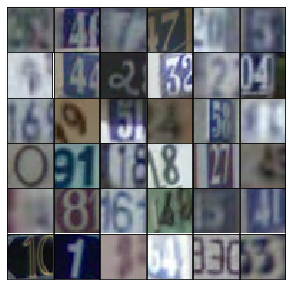

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)): # tanh
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range (-1, 1)
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        
        return logits

## Model Loss

Calculating the loss like before, nothing new here.

In [ ]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    input_gen = generator(input_z, output_dim, alpha=alpha)
    Q = discriminator(input_real, alpha=alpha)
    q = discriminator(input_gen, alpha=alpha, reuse=True)
    d_loss = tf.reduce_mean(Q-q) 
    g_loss = tf.reduce_mean(q)

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [ ]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [ ]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z, real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [ ]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [ ]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))
                
                if len(x) != batch_size:
                    print(batch_z.shape, x.shape)
                    
                else:
                    # Run optimizers
                    dloss, _ = sess.run([net.d_loss, net.d_opt], feed_dict={net.input_real: x, net.input_z: batch_z})
                    gloss, _ = sess.run([net.g_loss, net.g_opt], feed_dict={net.input_real: x, net.input_z: batch_z})

                    steps += 1
                    if steps % print_every == 0:
                        print("Epoch {}/{}...".format(e+1, epochs),
                              "Dloss: {:.4f}".format(dloss),
                              "Gloss: {:.4f}".format(gloss))
                        # Save losses to view after training
                        losses.append((dloss, gloss))

                    if steps % show_every == 0:
                        gen_samples = sess.run(
                                       generator(net.input_z, 3, reuse=True, training=False),
                                       feed_dict={net.input_z: sample_z})
                        samples.append(gen_samples)
                        _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                        plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

        with open('samples.pkl', 'wb') as f:
            pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [ ]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 100
alpha = 0.2
beta1 = 0.5

tf.reset_default_graph()

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

dataset = Dataset(trainset, testset)

Epoch 1/100... Dloss: -2.5077 Gloss: 4.0762
Epoch 1/100... Dloss: -19.1815 Gloss: 19.4020
Epoch 1/100... Dloss: -31.6584 Gloss: 25.2958
Epoch 1/100... Dloss: -50.7995 Gloss: 36.6446
Epoch 1/100... Dloss: -65.9405 Gloss: 43.8457
Epoch 1/100... Dloss: -79.8979 Gloss: 47.1074
Epoch 1/100... Dloss: -28.7608 Gloss: 33.6423
Epoch 1/100... Dloss: -38.8797 Gloss: 33.9789
Epoch 1/100... Dloss: -55.1095 Gloss: 49.9547
Epoch 1/100... Dloss: -84.4639 Gloss: 51.0415


/home/arasdar/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:1324: MatplotlibDeprecationWarning: 
box-forced
  "2.2", "box-forced", obj_type="keyword argument")


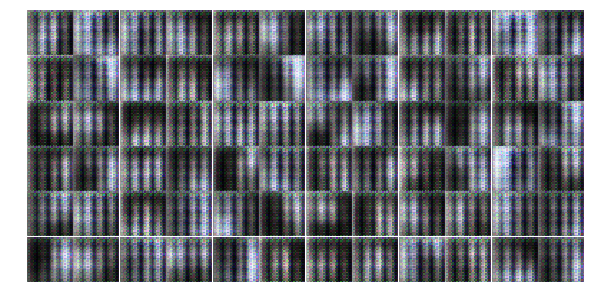

Epoch 1/100... Dloss: -94.5191 Gloss: 59.0411
Epoch 1/100... Dloss: -113.7664 Gloss: 61.0708
Epoch 1/100... Dloss: -75.9323 Gloss: 42.4892
Epoch 1/100... Dloss: -79.2299 Gloss: 42.1343
Epoch 1/100... Dloss: -103.6202 Gloss: 60.5142
Epoch 1/100... Dloss: -32.8705 Gloss: 53.9131
Epoch 1/100... Dloss: -51.0956 Gloss: 33.5701
Epoch 1/100... Dloss: -77.2563 Gloss: 33.5193
Epoch 1/100... Dloss: -41.4916 Gloss: 49.9720
Epoch 1/100... Dloss: -81.1380 Gloss: 58.2798


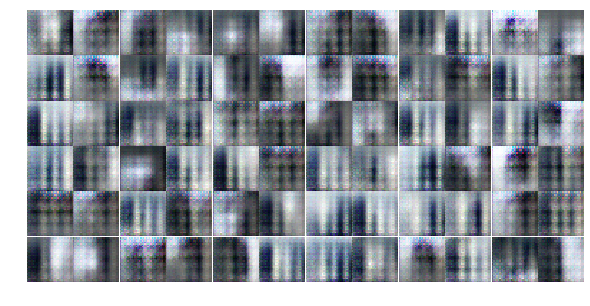

Epoch 1/100... Dloss: -66.1163 Gloss: 51.9545
Epoch 1/100... Dloss: -47.9853 Gloss: 58.9926
Epoch 1/100... Dloss: -88.7153 Gloss: 79.9107
Epoch 1/100... Dloss: -48.8423 Gloss: 41.4859
Epoch 1/100... Dloss: -92.4447 Gloss: 71.6942
Epoch 1/100... Dloss: 2.3387 Gloss: -80.3565
Epoch 1/100... Dloss: -48.4660 Gloss: 31.8364
Epoch 1/100... Dloss: -0.7207 Gloss: -90.0941
Epoch 1/100... Dloss: -23.8669 Gloss: -28.2692
Epoch 1/100... Dloss: -27.6013 Gloss: 10.8051


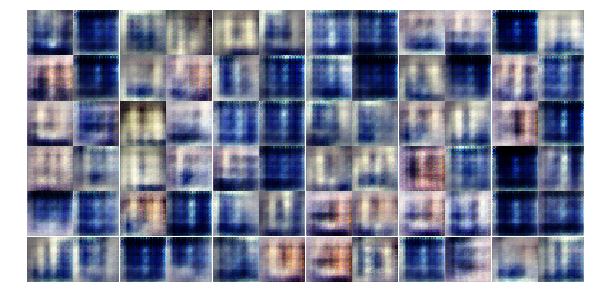

Epoch 1/100... Dloss: -64.8594 Gloss: 44.7569
Epoch 1/100... Dloss: -91.7875 Gloss: 58.6341
Epoch 1/100... Dloss: -54.7470 Gloss: 29.9147
Epoch 1/100... Dloss: -114.2561 Gloss: 73.7770
Epoch 1/100... Dloss: -46.4118 Gloss: 38.0261
Epoch 1/100... Dloss: -60.2597 Gloss: 50.1563
Epoch 1/100... Dloss: -11.6849 Gloss: 25.2804
Epoch 1/100... Dloss: -24.9060 Gloss: 68.4113
Epoch 1/100... Dloss: -27.6512 Gloss: 27.6948
Epoch 1/100... Dloss: -63.7832 Gloss: 52.9737


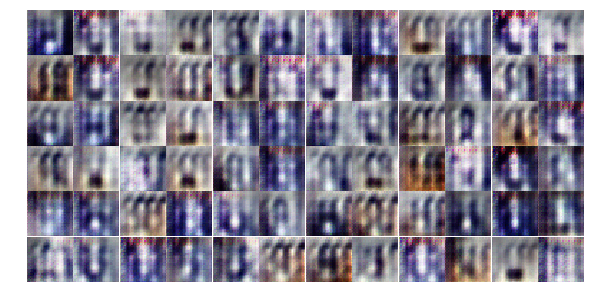

Epoch 1/100... Dloss: -12.8389 Gloss: -29.8266
Epoch 1/100... Dloss: -4.0897 Gloss: 0.2847
Epoch 1/100... Dloss: -14.0611 Gloss: 37.4806
Epoch 1/100... Dloss: -12.3043 Gloss: 19.7714
Epoch 1/100... Dloss: -13.9758 Gloss: 10.2408
Epoch 1/100... Dloss: 1.1465 Gloss: 19.5180
Epoch 1/100... Dloss: -28.9000 Gloss: 55.2772
Epoch 1/100... Dloss: -1.9669 Gloss: 22.3208
Epoch 1/100... Dloss: -51.6088 Gloss: 38.2554
Epoch 1/100... Dloss: 7.6881 Gloss: -1.3672


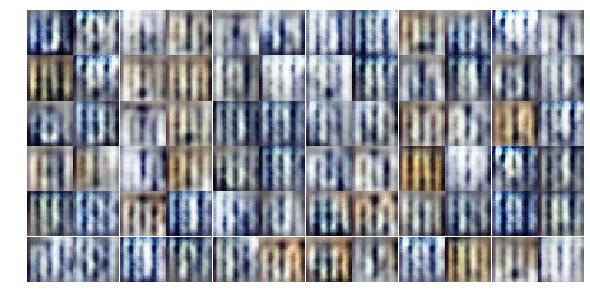

Epoch 1/100... Dloss: -19.1884 Gloss: 33.9624
Epoch 1/100... Dloss: -10.3802 Gloss: 52.2326
Epoch 1/100... Dloss: -31.3407 Gloss: 20.0615
Epoch 1/100... Dloss: 1.5263 Gloss: 42.3028
Epoch 1/100... Dloss: -28.1065 Gloss: 55.3673
Epoch 1/100... Dloss: -21.2991 Gloss: 60.4602
Epoch 1/100... Dloss: -52.0966 Gloss: 58.3126
(128, 100) (41, 32, 32, 3)
Epoch 2/100... Dloss: -37.7232 Gloss: 65.4534
Epoch 2/100... Dloss: -29.0035 Gloss: 71.5174
Epoch 2/100... Dloss: -43.9532 Gloss: 45.6858


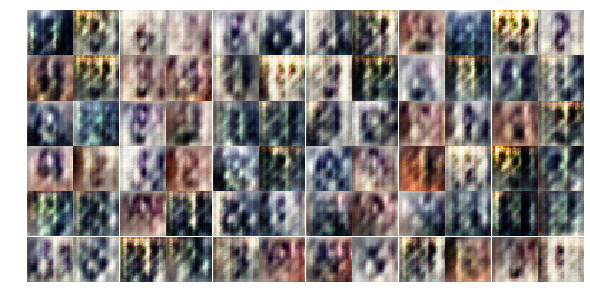

Epoch 2/100... Dloss: -52.4748 Gloss: 53.3215
Epoch 2/100... Dloss: -45.7663 Gloss: 85.7467
Epoch 2/100... Dloss: 13.0201 Gloss: -33.4384
Epoch 2/100... Dloss: -29.2193 Gloss: 40.3385
Epoch 2/100... Dloss: -28.8766 Gloss: 48.7733
Epoch 2/100... Dloss: -2.4235 Gloss: 71.6262
Epoch 2/100... Dloss: 14.0353 Gloss: 31.4449
Epoch 2/100... Dloss: -10.3059 Gloss: 39.3502
Epoch 2/100... Dloss: -34.3078 Gloss: 59.8676
Epoch 2/100... Dloss: -3.7230 Gloss: 35.2447


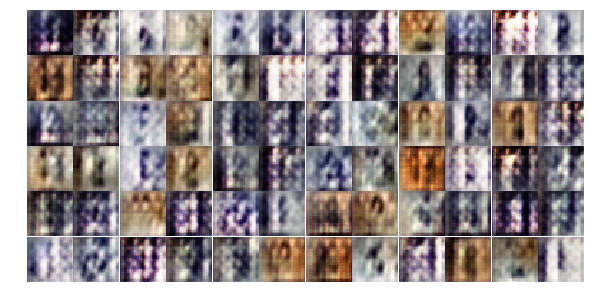

Epoch 2/100... Dloss: -35.6848 Gloss: 38.6218
Epoch 2/100... Dloss: -23.0644 Gloss: 72.1252
Epoch 2/100... Dloss: -45.4421 Gloss: 48.8373
Epoch 2/100... Dloss: -18.0083 Gloss: 80.3938
Epoch 2/100... Dloss: -43.3089 Gloss: 50.9019
Epoch 2/100... Dloss: -7.0367 Gloss: 51.6358
Epoch 2/100... Dloss: -64.2621 Gloss: 67.9290
Epoch 2/100... Dloss: -28.2913 Gloss: 84.8546
Epoch 2/100... Dloss: 3.5196 Gloss: 96.1325
Epoch 2/100... Dloss: -68.4739 Gloss: 71.8905


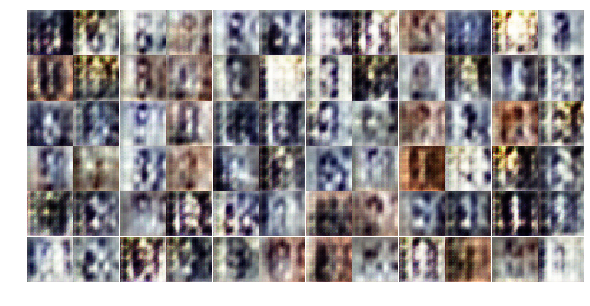

Epoch 2/100... Dloss: -49.8571 Gloss: 71.9651
Epoch 2/100... Dloss: -77.4069 Gloss: 84.8450
Epoch 2/100... Dloss: 15.8103 Gloss: 89.4981
Epoch 2/100... Dloss: -28.8607 Gloss: 41.5577
Epoch 2/100... Dloss: -0.3509 Gloss: -14.0629
Epoch 2/100... Dloss: -37.4787 Gloss: 45.8475
Epoch 2/100... Dloss: -46.7687 Gloss: 35.3298
Epoch 2/100... Dloss: 39.6490 Gloss: -89.9867
Epoch 2/100... Dloss: -12.3418 Gloss: -43.0407
Epoch 2/100... Dloss: -47.7064 Gloss: 43.0072


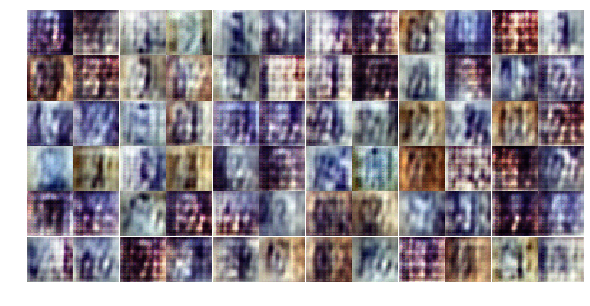

Epoch 2/100... Dloss: -22.3852 Gloss: 24.0911
Epoch 2/100... Dloss: -5.6704 Gloss: 13.9378
Epoch 2/100... Dloss: -42.0321 Gloss: 50.9639
Epoch 2/100... Dloss: -40.0733 Gloss: 82.3393
Epoch 2/100... Dloss: -86.4699 Gloss: 59.9935
Epoch 2/100... Dloss: -42.5576 Gloss: 51.8823
Epoch 2/100... Dloss: -48.1838 Gloss: 58.9926
Epoch 2/100... Dloss: -52.1007 Gloss: 32.7999
Epoch 2/100... Dloss: 64.2444 Gloss: -40.2480
Epoch 2/100... Dloss: -36.8865 Gloss: -11.0778


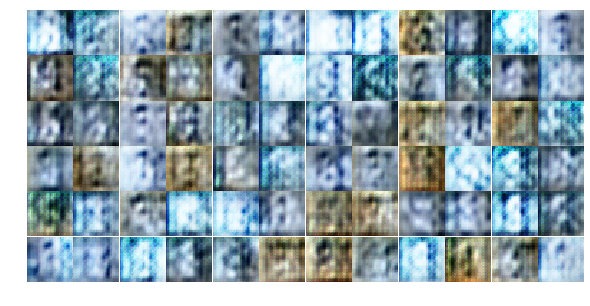

Epoch 2/100... Dloss: -41.5774 Gloss: 87.6749
Epoch 2/100... Dloss: -15.7261 Gloss: 7.6818
Epoch 2/100... Dloss: -4.3621 Gloss: 34.7658
Epoch 2/100... Dloss: -14.6846 Gloss: 39.2633
Epoch 2/100... Dloss: 11.6720 Gloss: 18.9581
Epoch 2/100... Dloss: -47.3136 Gloss: 40.8986
Epoch 2/100... Dloss: -38.1791 Gloss: 20.7128
Epoch 2/100... Dloss: -21.4255 Gloss: 64.5181
Epoch 2/100... Dloss: 16.4033 Gloss: 6.3970
Epoch 2/100... Dloss: -17.1149 Gloss: 3.5253


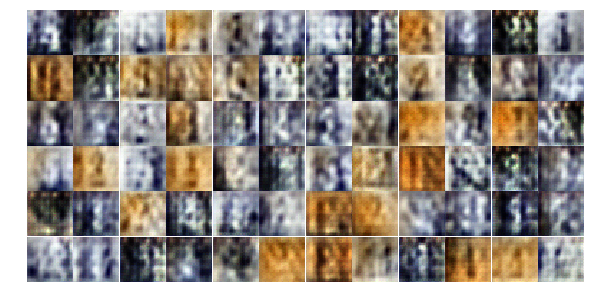

Epoch 2/100... Dloss: -7.6311 Gloss: 5.9895
Epoch 2/100... Dloss: -42.3605 Gloss: 49.5975
Epoch 2/100... Dloss: -21.0812 Gloss: 42.2595
Epoch 2/100... Dloss: -6.1322 Gloss: 48.8834
(128, 100) (41, 32, 32, 3)
Epoch 3/100... Dloss: -17.6471 Gloss: -0.1282
Epoch 3/100... Dloss: -20.3938 Gloss: 2.0419
Epoch 3/100... Dloss: -57.7415 Gloss: 49.0413
Epoch 3/100... Dloss: -30.9955 Gloss: 74.7948
Epoch 3/100... Dloss: -64.7241 Gloss: 66.1635
Epoch 3/100... Dloss: -37.0510 Gloss: 43.0651


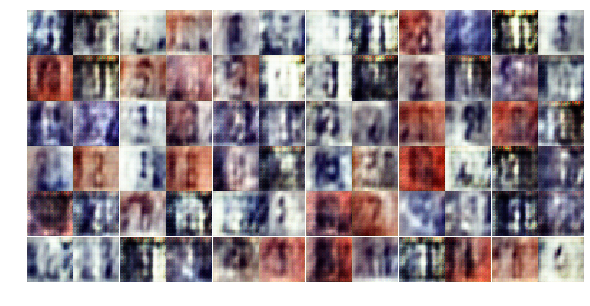

Epoch 3/100... Dloss: -29.0106 Gloss: 141.6267
Epoch 3/100... Dloss: -60.5915 Gloss: 68.4875
Epoch 3/100... Dloss: 2.3325 Gloss: -60.3865
Epoch 3/100... Dloss: -19.4679 Gloss: 71.6796
Epoch 3/100... Dloss: -35.4505 Gloss: -23.6870
Epoch 3/100... Dloss: 59.0738 Gloss: -76.5612
Epoch 3/100... Dloss: -11.4676 Gloss: -85.3406
Epoch 3/100... Dloss: -39.2064 Gloss: -39.0380
Epoch 3/100... Dloss: 8.2514 Gloss: -6.7499
Epoch 3/100... Dloss: -14.6018 Gloss: -43.6903


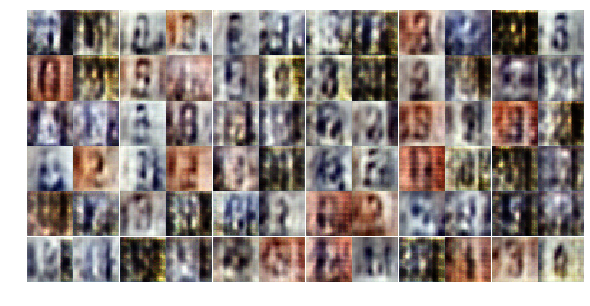

Epoch 3/100... Dloss: 4.9969 Gloss: -33.4334
Epoch 3/100... Dloss: -16.1222 Gloss: 35.2815
Epoch 3/100... Dloss: 0.2762 Gloss: -16.7789
Epoch 3/100... Dloss: -13.0319 Gloss: 41.8847
Epoch 3/100... Dloss: 1.6856 Gloss: 22.6094
Epoch 3/100... Dloss: -36.3889 Gloss: 50.3396
Epoch 3/100... Dloss: -29.7567 Gloss: 96.8004
Epoch 3/100... Dloss: -60.2121 Gloss: 42.3627
Epoch 3/100... Dloss: -44.3216 Gloss: 97.8556
Epoch 3/100... Dloss: 0.1537 Gloss: 62.6187


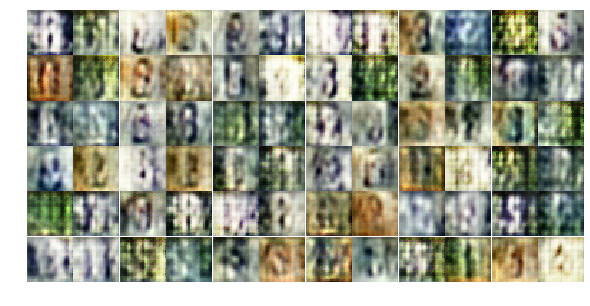

Epoch 3/100... Dloss: 41.8038 Gloss: -171.1396
Epoch 3/100... Dloss: -16.7595 Gloss: -150.8024
Epoch 3/100... Dloss: -2.7289 Gloss: -127.9229
Epoch 3/100... Dloss: -20.3909 Gloss: -126.6977
Epoch 3/100... Dloss: 1.3441 Gloss: -160.6440
Epoch 3/100... Dloss: -16.2220 Gloss: -142.7210
Epoch 3/100... Dloss: -13.5724 Gloss: -142.0719
Epoch 3/100... Dloss: -13.4030 Gloss: -140.9021
Epoch 3/100... Dloss: 9.7669 Gloss: -121.4797
Epoch 3/100... Dloss: -68.8702 Gloss: 54.4361


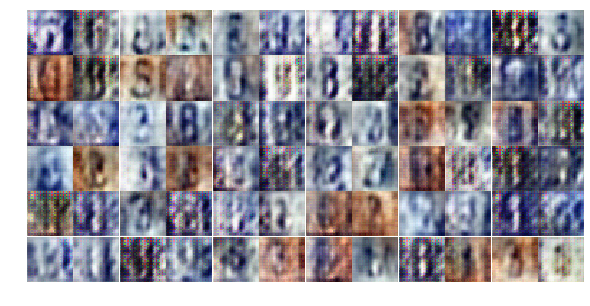

Epoch 3/100... Dloss: -96.4575 Gloss: 169.3666
Epoch 3/100... Dloss: -138.8260 Gloss: 90.1039
Epoch 3/100... Dloss: -98.0687 Gloss: 104.9007
Epoch 3/100... Dloss: -21.3023 Gloss: 151.7939
Epoch 3/100... Dloss: 11.5264 Gloss: -42.1360
Epoch 3/100... Dloss: -11.4897 Gloss: -92.7602
Epoch 3/100... Dloss: -30.4404 Gloss: -80.4167
Epoch 3/100... Dloss: -11.3378 Gloss: -50.5065
Epoch 3/100... Dloss: -53.1032 Gloss: 8.7611
Epoch 3/100... Dloss: -64.4828 Gloss: 60.5361


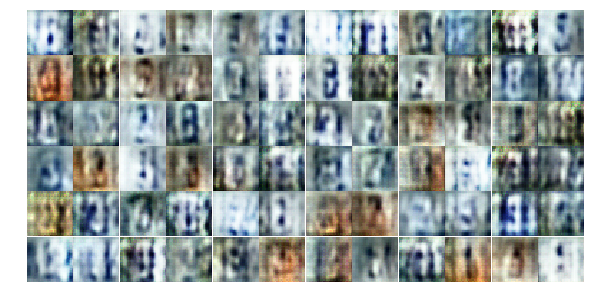

Epoch 3/100... Dloss: -42.9103 Gloss: 33.6923
Epoch 3/100... Dloss: -40.1938 Gloss: -52.8770
Epoch 3/100... Dloss: -84.7657 Gloss: 40.9817
Epoch 3/100... Dloss: 45.9585 Gloss: 60.4093
Epoch 3/100... Dloss: -161.5187 Gloss: 90.4877
Epoch 3/100... Dloss: -106.1732 Gloss: 79.0551
Epoch 3/100... Dloss: -101.9688 Gloss: 150.4869
Epoch 3/100... Dloss: -150.3516 Gloss: 219.0268
Epoch 3/100... Dloss: 18.0212 Gloss: 44.2922
Epoch 3/100... Dloss: 23.8814 Gloss: -243.7598


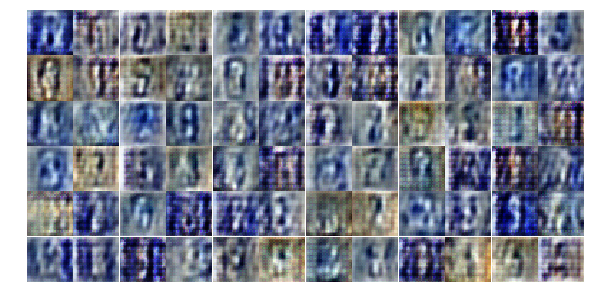

Epoch 3/100... Dloss: -41.9755 Gloss: -180.5151
(128, 100) (41, 32, 32, 3)
Epoch 4/100... Dloss: -74.2320 Gloss: -102.6732
Epoch 4/100... Dloss: -55.0789 Gloss: 9.2071
Epoch 4/100... Dloss: -144.1298 Gloss: 67.4077
Epoch 4/100... Dloss: -1.0291 Gloss: -227.2507
Epoch 4/100... Dloss: -249.6635 Gloss: 104.4695
Epoch 4/100... Dloss: -277.5495 Gloss: 264.1677
Epoch 4/100... Dloss: -315.2271 Gloss: 220.2513
Epoch 4/100... Dloss: 17.7271 Gloss: 275.3459
Epoch 4/100... Dloss: -78.6592 Gloss: 239.0649


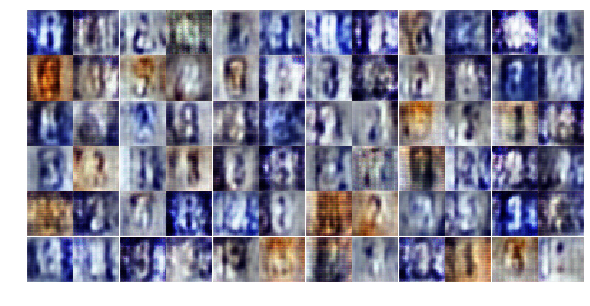

Epoch 4/100... Dloss: -14.7047 Gloss: 48.5661
Epoch 4/100... Dloss: -11.6336 Gloss: -4.3817
Epoch 4/100... Dloss: -130.9465 Gloss: 224.9736
Epoch 4/100... Dloss: -26.0467 Gloss: 300.7124
Epoch 4/100... Dloss: -25.5471 Gloss: -9.2685
Epoch 4/100... Dloss: -73.1594 Gloss: 232.4004
Epoch 4/100... Dloss: 81.0431 Gloss: 42.3914
Epoch 4/100... Dloss: -19.7044 Gloss: -290.6798
Epoch 4/100... Dloss: -34.8219 Gloss: -197.3666
Epoch 4/100... Dloss: -21.1115 Gloss: -83.7138


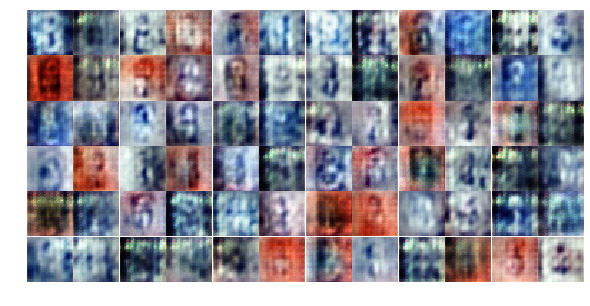

Epoch 4/100... Dloss: -166.8947 Gloss: 190.2886
Epoch 4/100... Dloss: -71.9821 Gloss: 289.4696
Epoch 4/100... Dloss: -186.5619 Gloss: 228.4469
Epoch 4/100... Dloss: -408.4348 Gloss: 286.3353
Epoch 4/100... Dloss: 42.2048 Gloss: 318.8517
Epoch 4/100... Dloss: -4.2552 Gloss: 333.3769
Epoch 4/100... Dloss: -37.8736 Gloss: 181.7902
Epoch 4/100... Dloss: -48.7974 Gloss: 202.7679
Epoch 4/100... Dloss: 33.7098 Gloss: 251.5000
Epoch 4/100... Dloss: -25.7830 Gloss: 290.9045


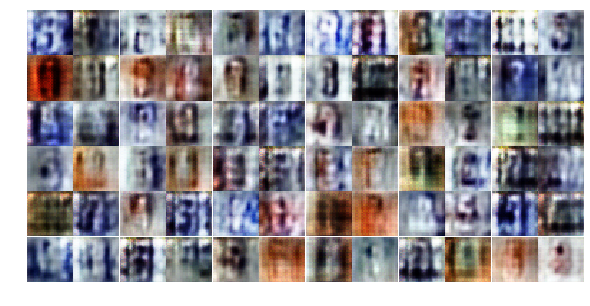

Epoch 4/100... Dloss: 7.8391 Gloss: 217.7994
Epoch 4/100... Dloss: -27.5515 Gloss: 220.3705
Epoch 4/100... Dloss: -52.7530 Gloss: 222.2066
Epoch 4/100... Dloss: -45.7757 Gloss: 130.3500
Epoch 4/100... Dloss: -200.1506 Gloss: 368.4980
Epoch 4/100... Dloss: -227.3387 Gloss: 354.4332
Epoch 4/100... Dloss: -1.2865 Gloss: -287.8835
Epoch 4/100... Dloss: 30.4124 Gloss: -303.3287
Epoch 4/100... Dloss: -22.9104 Gloss: -159.8890
Epoch 4/100... Dloss: -61.7284 Gloss: -140.1849


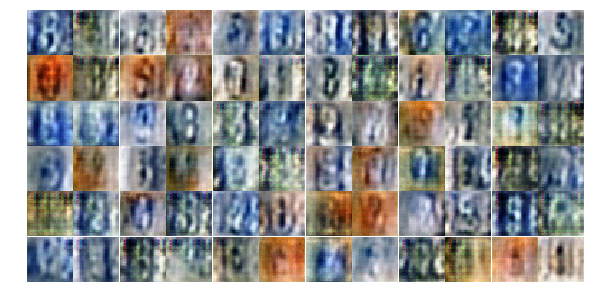

Epoch 4/100... Dloss: -70.1899 Gloss: 210.6610
Epoch 4/100... Dloss: -188.1246 Gloss: 7.4743
Epoch 4/100... Dloss: -156.6402 Gloss: 170.9118
Epoch 4/100... Dloss: -7.8711 Gloss: -235.3833
Epoch 4/100... Dloss: -55.8852 Gloss: 109.6448
Epoch 4/100... Dloss: -58.6851 Gloss: -1.0980
Epoch 4/100... Dloss: 5.9095 Gloss: 179.8989
Epoch 4/100... Dloss: -37.0705 Gloss: -10.7305
Epoch 4/100... Dloss: -11.2408 Gloss: 102.7659
Epoch 4/100... Dloss: 53.7938 Gloss: -67.5776


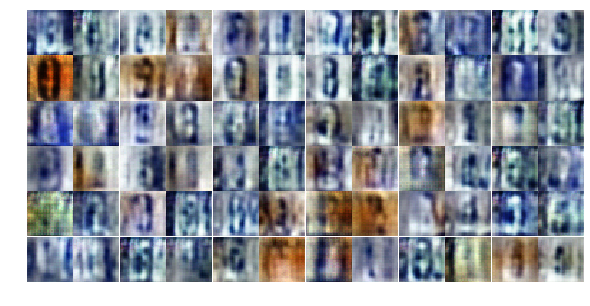

Epoch 4/100... Dloss: 18.0807 Gloss: -79.2505
Epoch 4/100... Dloss: 9.4178 Gloss: 62.1294
Epoch 4/100... Dloss: -57.3819 Gloss: 166.0461
Epoch 4/100... Dloss: -21.2217 Gloss: 146.7485
Epoch 4/100... Dloss: -36.3670 Gloss: 154.9193
Epoch 4/100... Dloss: -37.9402 Gloss: 174.6606
Epoch 4/100... Dloss: 28.3531 Gloss: 18.2300
Epoch 4/100... Dloss: -34.1520 Gloss: -20.4854
(128, 100) (41, 32, 32, 3)
Epoch 5/100... Dloss: -16.4710 Gloss: -13.5320
Epoch 5/100... Dloss: -26.8279 Gloss: 180.2140


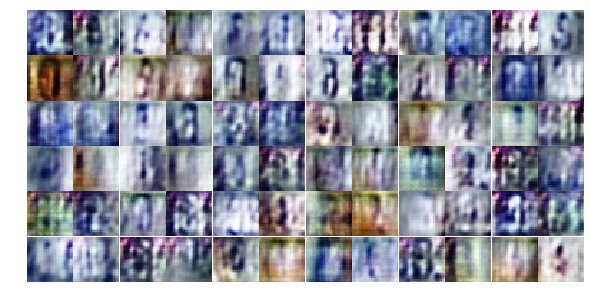

Epoch 5/100... Dloss: -11.3977 Gloss: 179.5547
Epoch 5/100... Dloss: -12.0256 Gloss: 75.2217
Epoch 5/100... Dloss: -46.7564 Gloss: 129.6413
Epoch 5/100... Dloss: 23.4244 Gloss: 52.4264
Epoch 5/100... Dloss: 23.5774 Gloss: -20.3044
Epoch 5/100... Dloss: -35.5385 Gloss: 33.2992
Epoch 5/100... Dloss: -32.0456 Gloss: 36.5680
Epoch 5/100... Dloss: -18.1506 Gloss: 130.5889
Epoch 5/100... Dloss: -22.8851 Gloss: 160.2926
Epoch 5/100... Dloss: -34.0464 Gloss: 106.4159


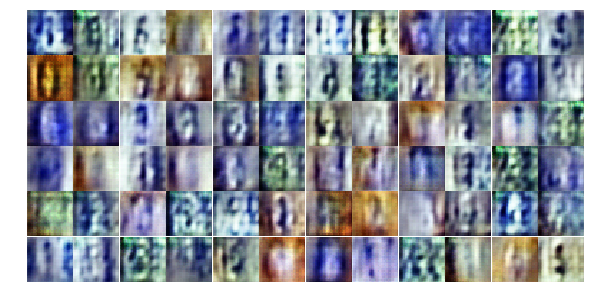

Epoch 5/100... Dloss: 11.6085 Gloss: 57.2370
Epoch 5/100... Dloss: 11.7952 Gloss: 58.5094
Epoch 5/100... Dloss: 15.1003 Gloss: 75.8741
Epoch 5/100... Dloss: -34.6456 Gloss: 69.0091
Epoch 5/100... Dloss: 20.6038 Gloss: 71.6738
Epoch 5/100... Dloss: -9.9616 Gloss: 43.4844
Epoch 5/100... Dloss: -15.4343 Gloss: 34.4868
Epoch 5/100... Dloss: -13.7239 Gloss: 18.9550
Epoch 5/100... Dloss: -21.3309 Gloss: 43.0910
Epoch 5/100... Dloss: -14.6309 Gloss: 35.9164


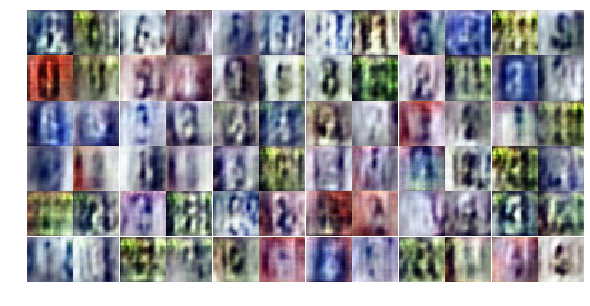

Epoch 5/100... Dloss: -21.4219 Gloss: 21.1915
Epoch 5/100... Dloss: -4.3430 Gloss: 5.3877
Epoch 5/100... Dloss: 1.0453 Gloss: 61.3669
Epoch 5/100... Dloss: -47.9163 Gloss: 108.9167
Epoch 5/100... Dloss: -17.2170 Gloss: 139.3121
Epoch 5/100... Dloss: -43.6921 Gloss: 154.5316
Epoch 5/100... Dloss: -19.0539 Gloss: 63.7698
Epoch 5/100... Dloss: -8.2951 Gloss: 134.7895
Epoch 5/100... Dloss: 2.4217 Gloss: 109.6624
Epoch 5/100... Dloss: -46.5037 Gloss: 106.1452


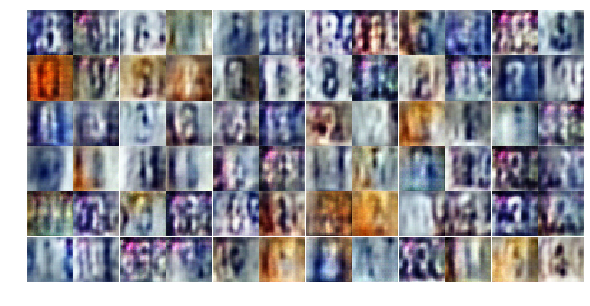

Epoch 5/100... Dloss: 5.7611 Gloss: 197.1465
Epoch 5/100... Dloss: -50.7291 Gloss: 133.1460
Epoch 5/100... Dloss: -5.2550 Gloss: 170.2085
Epoch 5/100... Dloss: 12.8763 Gloss: 154.4942
Epoch 5/100... Dloss: -76.7316 Gloss: 145.2274
Epoch 5/100... Dloss: -6.5114 Gloss: 123.6048
Epoch 5/100... Dloss: -5.9694 Gloss: 38.1133
Epoch 5/100... Dloss: -7.1114 Gloss: 86.0197
Epoch 5/100... Dloss: 0.3809 Gloss: 86.5993
Epoch 5/100... Dloss: -86.4548 Gloss: 67.1946


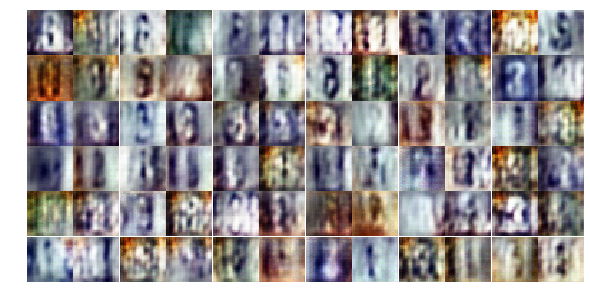

Epoch 5/100... Dloss: -0.3071 Gloss: 5.2033
Epoch 5/100... Dloss: -42.4239 Gloss: 142.1571
Epoch 5/100... Dloss: -1.2595 Gloss: 124.4445
Epoch 5/100... Dloss: -80.0845 Gloss: 162.6661
Epoch 5/100... Dloss: -23.9903 Gloss: 45.6503
Epoch 5/100... Dloss: -30.2086 Gloss: 40.5787
Epoch 5/100... Dloss: 29.1429 Gloss: 25.1856
Epoch 5/100... Dloss: 23.1612 Gloss: 98.6212
Epoch 5/100... Dloss: -92.0592 Gloss: 204.2997
Epoch 5/100... Dloss: 65.1617 Gloss: 217.4825


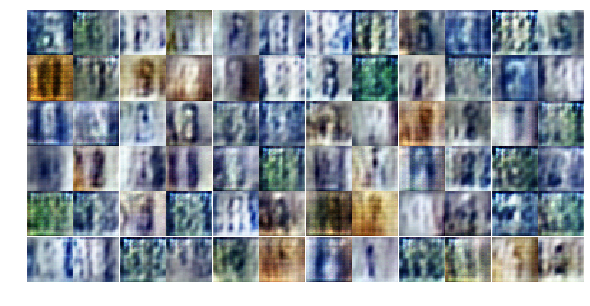

Epoch 5/100... Dloss: -23.2114 Gloss: 312.5603
Epoch 5/100... Dloss: -128.3426 Gloss: 57.1450
Epoch 5/100... Dloss: 79.7902 Gloss: -68.0391
Epoch 5/100... Dloss: -5.6114 Gloss: -93.2497
Epoch 5/100... Dloss: 49.6558 Gloss: 2.0268
Epoch 5/100... Dloss: -35.6931 Gloss: 174.9604
(128, 100) (41, 32, 32, 3)
Epoch 6/100... Dloss: 26.2776 Gloss: 249.5329
Epoch 6/100... Dloss: -28.4183 Gloss: 279.1002
Epoch 6/100... Dloss: -50.2119 Gloss: 47.6817
Epoch 6/100... Dloss: -65.2807 Gloss: 53.5394


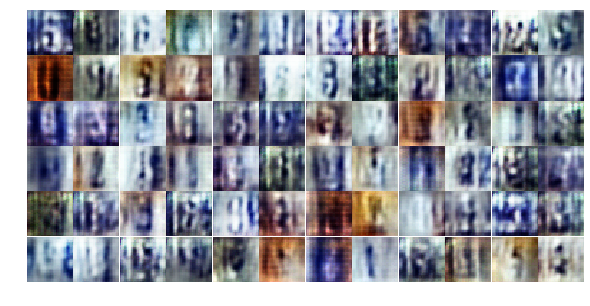

Epoch 6/100... Dloss: -1.9780 Gloss: -28.5058
Epoch 6/100... Dloss: -20.9693 Gloss: 49.1321
Epoch 6/100... Dloss: -36.0762 Gloss: 233.4323
Epoch 6/100... Dloss: 1.8465 Gloss: 131.0683
Epoch 6/100... Dloss: -48.4576 Gloss: 86.7345
Epoch 6/100... Dloss: -10.0226 Gloss: 175.5112
Epoch 6/100... Dloss: -150.9266 Gloss: 10.0215
Epoch 6/100... Dloss: -274.8569 Gloss: 240.2485
Epoch 6/100... Dloss: -173.8640 Gloss: 175.6090
Epoch 6/100... Dloss: -271.4514 Gloss: 433.5332


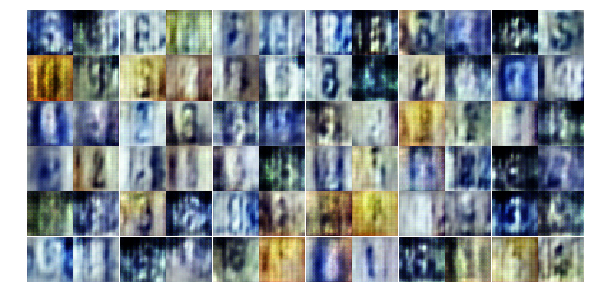

Epoch 6/100... Dloss: 31.0175 Gloss: -298.4731
Epoch 6/100... Dloss: -231.6194 Gloss: 343.5826
Epoch 6/100... Dloss: -86.7396 Gloss: 434.9783
Epoch 6/100... Dloss: -127.6545 Gloss: 294.5944
Epoch 6/100... Dloss: -46.8191 Gloss: 316.1893
Epoch 6/100... Dloss: -25.9990 Gloss: 133.8166
Epoch 6/100... Dloss: -11.3669 Gloss: 290.7339
Epoch 6/100... Dloss: -177.6779 Gloss: 338.6891
Epoch 6/100... Dloss: -25.6900 Gloss: 199.0292
Epoch 6/100... Dloss: -7.9389 Gloss: -46.3578


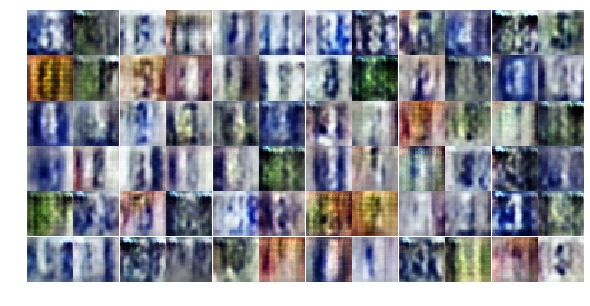

Epoch 6/100... Dloss: 0.4687 Gloss: -192.3982
Epoch 6/100... Dloss: -48.5138 Gloss: -72.9883
Epoch 6/100... Dloss: 39.2903 Gloss: -170.2736
Epoch 6/100... Dloss: -47.6948 Gloss: -95.1760
Epoch 6/100... Dloss: -24.8692 Gloss: -53.5425
Epoch 6/100... Dloss: -64.7179 Gloss: 19.8256
Epoch 6/100... Dloss: -7.0122 Gloss: 7.8533
Epoch 6/100... Dloss: -45.4809 Gloss: 135.1866
Epoch 6/100... Dloss: -24.8414 Gloss: 39.5521
Epoch 6/100... Dloss: -155.3199 Gloss: 104.9495


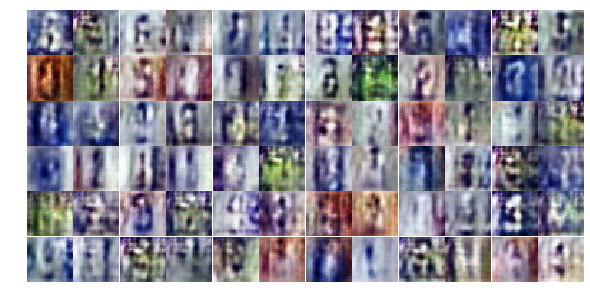

Epoch 6/100... Dloss: 25.6612 Gloss: 51.5293
Epoch 6/100... Dloss: -16.8129 Gloss: 112.4522
Epoch 6/100... Dloss: 43.0142 Gloss: 119.3990
Epoch 6/100... Dloss: -81.1208 Gloss: 154.0010
Epoch 6/100... Dloss: -62.0191 Gloss: 146.9509
Epoch 6/100... Dloss: -4.7220 Gloss: 124.4152
Epoch 6/100... Dloss: -27.0962 Gloss: 80.5824
Epoch 6/100... Dloss: -20.1805 Gloss: 116.5143
Epoch 6/100... Dloss: -32.8218 Gloss: 13.8951
Epoch 6/100... Dloss: 40.3178 Gloss: -45.2061


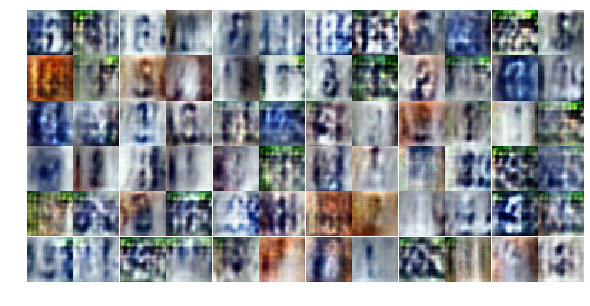

Epoch 6/100... Dloss: -49.8851 Gloss: 205.8423
Epoch 6/100... Dloss: -24.3065 Gloss: 157.8097
Epoch 6/100... Dloss: 6.4732 Gloss: 153.4028
Epoch 6/100... Dloss: -17.0298 Gloss: 16.7953
Epoch 6/100... Dloss: -71.6650 Gloss: 58.0429
Epoch 6/100... Dloss: -34.8932 Gloss: 16.9788
Epoch 6/100... Dloss: -2.8787 Gloss: 424.1119
Epoch 6/100... Dloss: -25.0504 Gloss: 254.1584
Epoch 6/100... Dloss: -11.9710 Gloss: 144.7008
Epoch 6/100... Dloss: -61.4196 Gloss: 29.1942


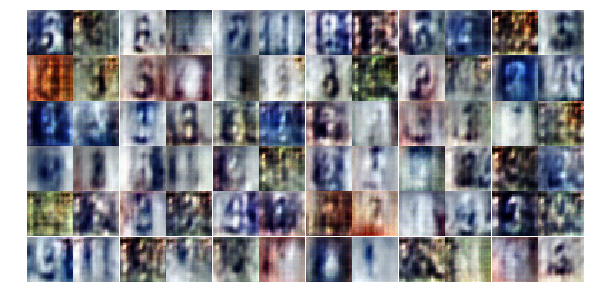

Epoch 6/100... Dloss: -5.3372 Gloss: -8.7631
Epoch 6/100... Dloss: -91.4107 Gloss: 62.3993
Epoch 6/100... Dloss: 46.9318 Gloss: 120.4549
(128, 100) (41, 32, 32, 3)
Epoch 7/100... Dloss: -70.3786 Gloss: 173.1031
Epoch 7/100... Dloss: -47.3082 Gloss: 81.0392


In [ ]:
losses, samples = train(net=net, dataset=dataset, epochs=epochs, batch_size=batch_size, figsize=(10,5))

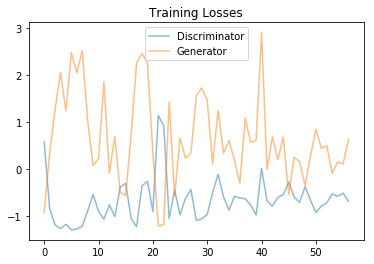

In [22]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

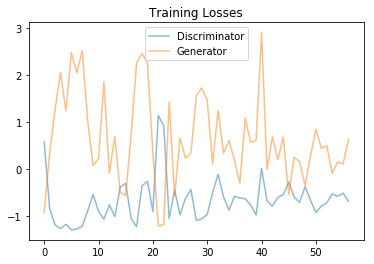

In [23]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


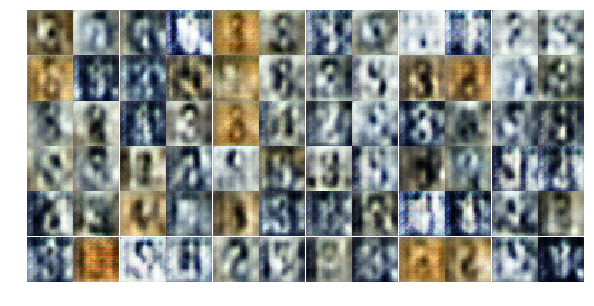

In [24]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

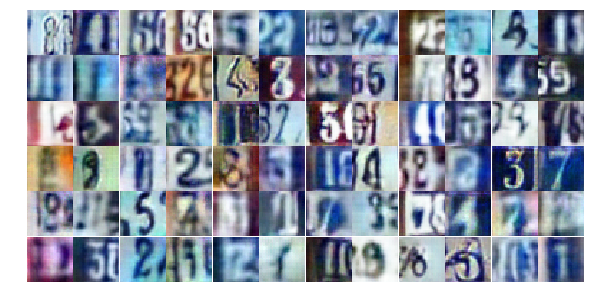

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))